In [4]:
!python3 algorithms/yolov5/train.py --img 512 --cfg yolov5x.yaml --hyp algorithms/yolov5/data/hyps/hyp.scratch-low.yaml --batch 9 --epochs 500 --data data/dataset.yaml --weights yolov5x.pt --workers 1 --name yolov5 --device 0,1,2

train: weights=yolov5x.pt, cfg=yolov5x.yaml, data=data/dataset.yaml, hyp=algorithms/yolov5/data/hyps/hyp.scratch-low.yaml, epochs=500, batch_size=9, imgsz=512, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=0,1,2, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=24, project=algorithms/yolov5/runs/train, name=yolov5, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: ⚠️ YOLOv5 is out of date by 59 commits. Use 'git pull' or 'git clone https://github.com/ultralytics/yolov5' to update.
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.8.18 torch-2.0.1 CUDA:0 (NVIDIA RTX A6000, 48677MiB)
                                                      CUDA:1 (NVIDIA RTX A6000, 48677MiB)
                                            

In [2]:
# load tensorboard in colab
%reload_ext tensorboard

# see curves in tensorboard
%tensorboard --logdir /home/safouane/Downloads/benchmark_aircraft/work_dirs/rtmdet_tiny_1xb4-20e_airplane

ERROR: Failed to launch TensorBoard (exited with 1).
Contents of stderr:
TensorFlow installation not found - running with reduced feature set.
/home/safouane/miniconda3/envs/openmmlab/lib/python3.8/site-packages/tensorboard_data_server/bin/server: /lib/x86_64-linux-gnu/libc.so.6: version `GLIBC_2.33' not found (required by /home/safouane/miniconda3/envs/openmmlab/lib/python3.8/site-packages/tensorboard_data_server/bin/server)
/home/safouane/miniconda3/envs/openmmlab/lib/python3.8/site-packages/tensorboard_data_server/bin/server: /lib/x86_64-linux-gnu/libc.so.6: version `GLIBC_2.34' not found (required by /home/safouane/miniconda3/envs/openmmlab/lib/python3.8/site-packages/tensorboard_data_server/bin/server)
/home/safouane/miniconda3/envs/openmmlab/lib/python3.8/site-packages/tensorboard_data_server/bin/server: /lib/x86_64-linux-gnu/libc.so.6: version `GLIBC_2.32' not found (required by /home/safouane/miniconda3/envs/openmmlab/lib/python3.8/site-packages/tensorboard_data_server/bin/serv

In [1]:
import os, PIL, ast, torch, tensorboard
import PIL.Image

from glob import glob
from pathlib import Path

import numpy as np
import pandas as pd

from IPython.display import Image, clear_output
from utils import getBounds, getHeight, getWidth

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # silence tf warnings 
# change path if your folder is in a different location / has a different name
images = glob('./data/airbus/images/*.jpg') #get all the .jpg from the data folder
img = PIL.Image.open(images[10])
#display(img) uncomment for visualization (heavy on memory)

In [2]:
!python3 algorithms/yolov5/detect.py --source unseen/ --weights algorithms/yolov5/runs/train/yolov5/weights/best.pt --conf 0.1 --name detection

detect: weights=['algorithms/yolov5/runs/train/yolov5/weights/best.pt'], source=unseen/, data=algorithms/yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=algorithms/yolov5/runs/detect, name=detection, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.8.10 torch-2.0.0+cu117 CUDA:0 (NVIDIA RTX A6000, 48685MiB)

Fusing layers... 
YOLOv5x summary: 322 layers, 86173414 parameters, 0 gradients, 203.8 GFLOPs
image 1/6 /home/safouane/Downloads/benchmark_aircraft/unseen/022f91f0-1434-401f-a11b-e315b7068100.jpg: 640x640 26 Aircrafts, 12.0ms
image 2/6 /home/safouane/Downloads/benchmark_aircraft/unseen/08a8132a-a6c7-4cab-adee-7e2976fd2822.jpg: 640x640 29 Aircrafts, 12.0ms
image 3/6 /home/safou

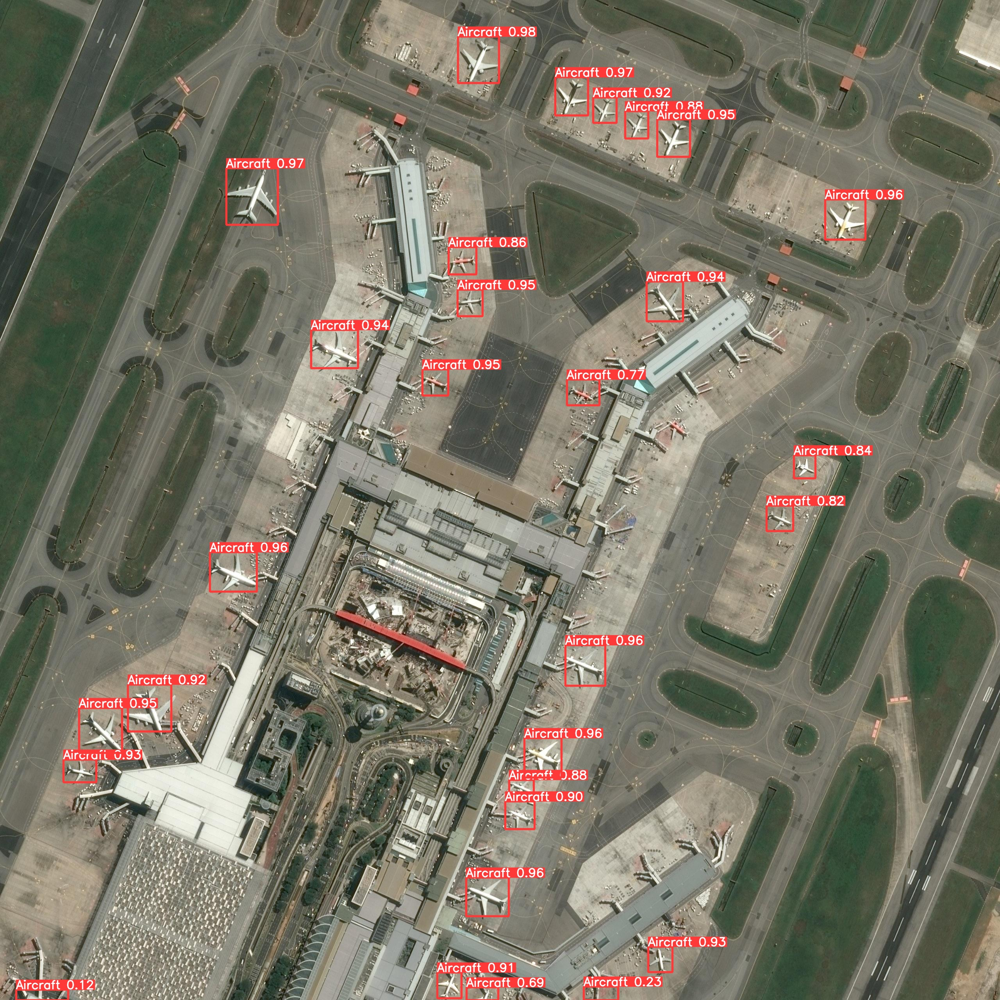

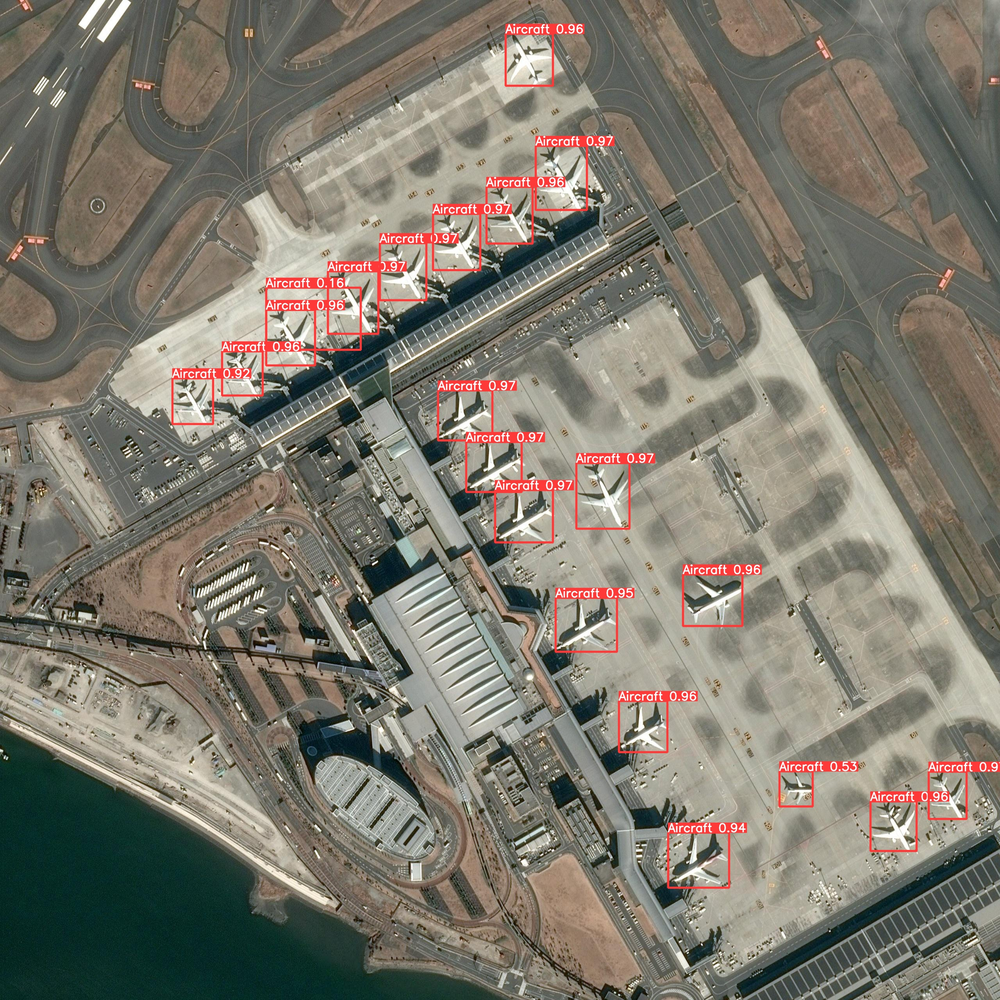

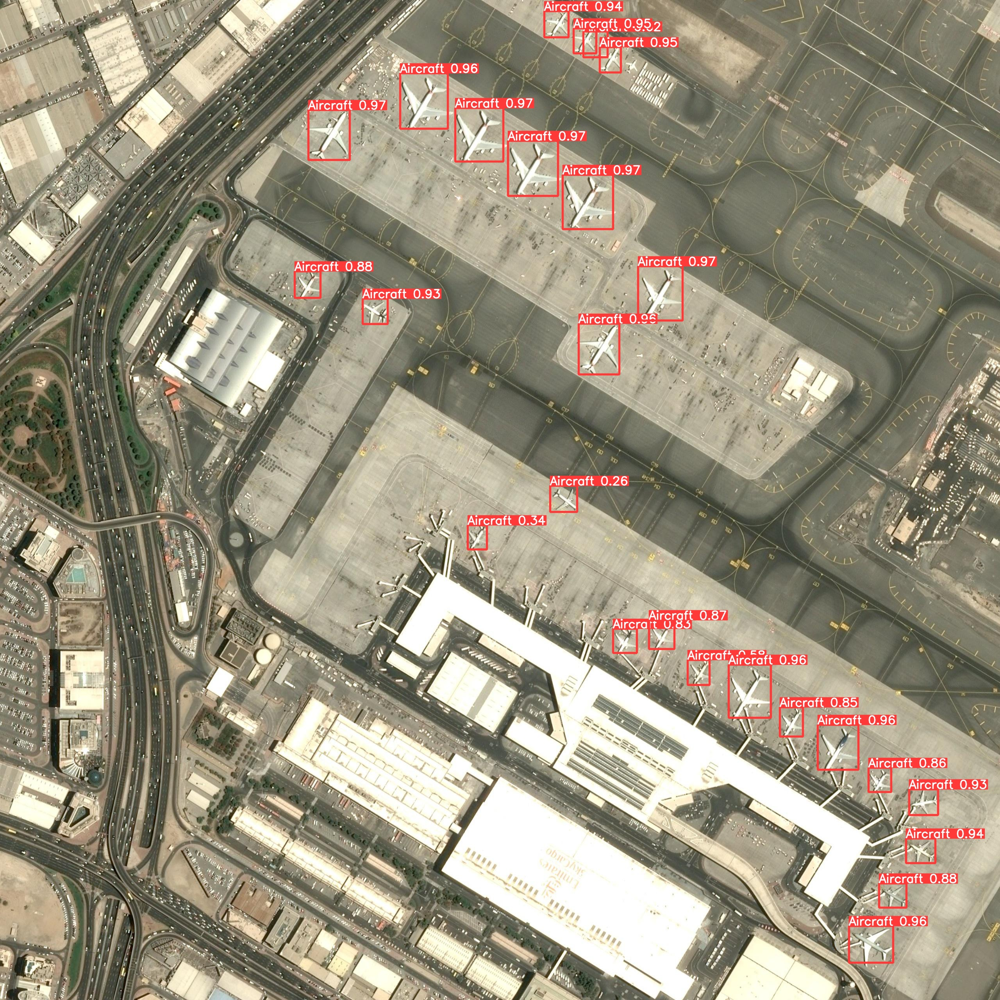

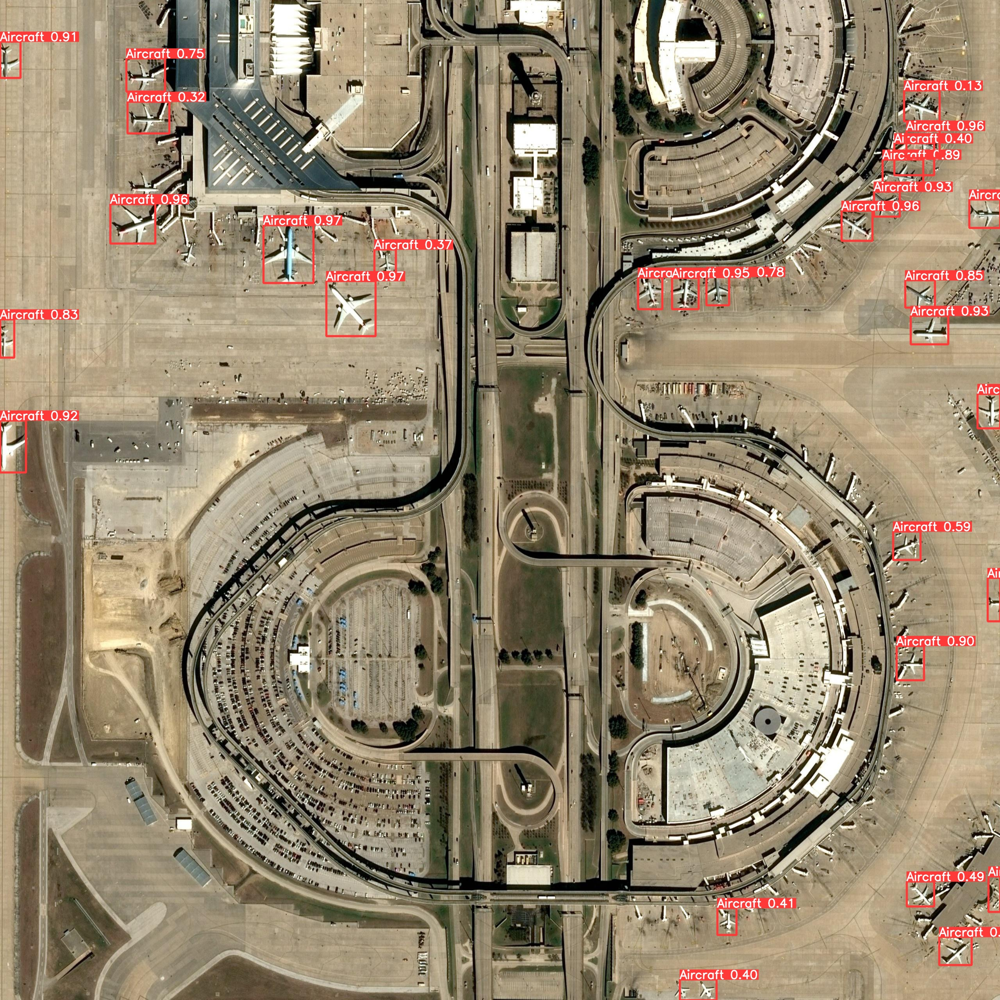

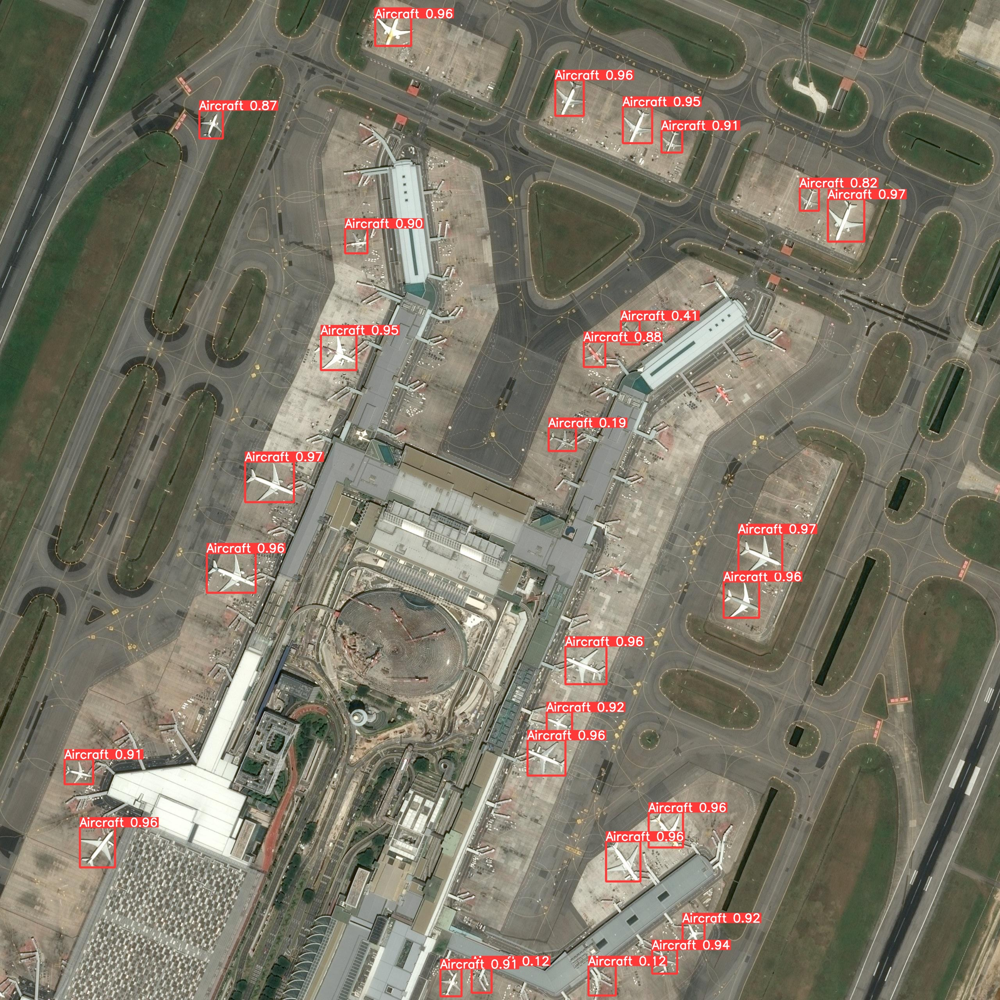

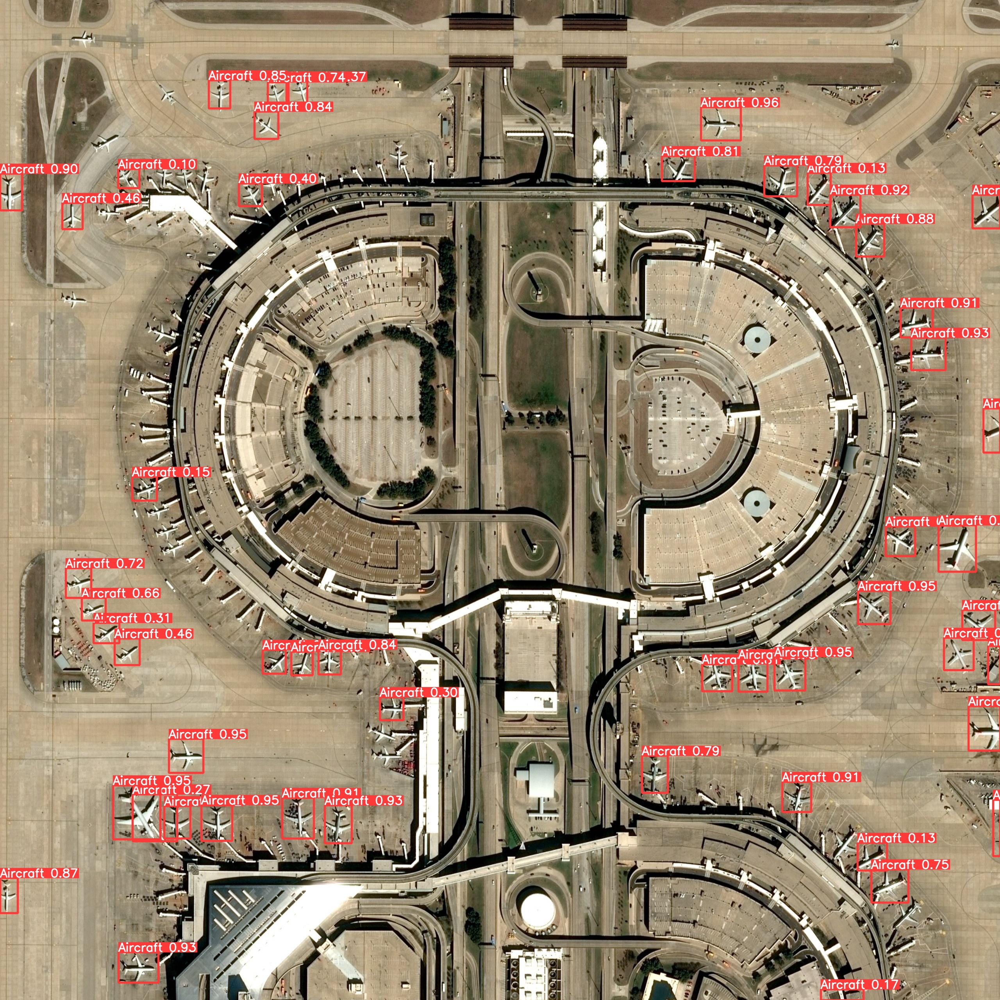

In [3]:
from IPython.display import display

for image_path in glob('./algorithms/yolov5/runs/detect/detection/*.jpg')[:]:
      display(Image(filename=image_path, width=512))